# NY State Covid-19 Data Visualizaion Project

In [1]:
#import library
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as dates
import matplotlib.patches as mpatches
%matplotlib inline

### Data Collection

In [2]:
#collect data
df_covid_data = pd.read_csv("https://health.data.ny.gov/api/views/xdss-u53e/rows.csv?accessType=DOWNLOAD")
df_covid_data['Test Date'] = df_covid_data['Test Date'].apply(pd.to_datetime)
df_covid_data.head()

,Test Date,County,New Positives,Cumulative Number of Positives,Total Number of Tests Performed,Cumulative Number of Tests Performed
0,2020-05-11,Albany,23,1479,341,14911
1,2020-05-11,Allegany,4,42,41,846
2,2020-05-11,Bronx,145,41441,1510,121455
3,2020-05-11,Broome,1,379,271,5512
4,2020-05-11,Cattaraugus,0,61,29,1497


### New Infections Broken Down by Date

In [11]:
#use groupby to aggergate total new positives per date
infections_date = df_covid_data.groupby(['Test Date'])['New Positives'].sum()
#use describe to see min/max and length
infections_date.describe()

count       71.000000
mean      4767.394366
std       3524.405849
min          0.000000
25%       1714.500000
50%       4681.000000
75%       7530.000000
max      11571.000000
Name: New Positives, dtype: float64

In [12]:
#filter infection rate and assign to group based on description
red1 = infections_date[infections_date > 8000]
orange1 = infections_date[infections_date.between(6000,7999)]
yellow1 = infections_date[infections_date.between(4000,5999)]
green1 = infections_date[infections_date.between(2000,3999)]
blue1 = infections_date[infections_date.between(0,1999)]

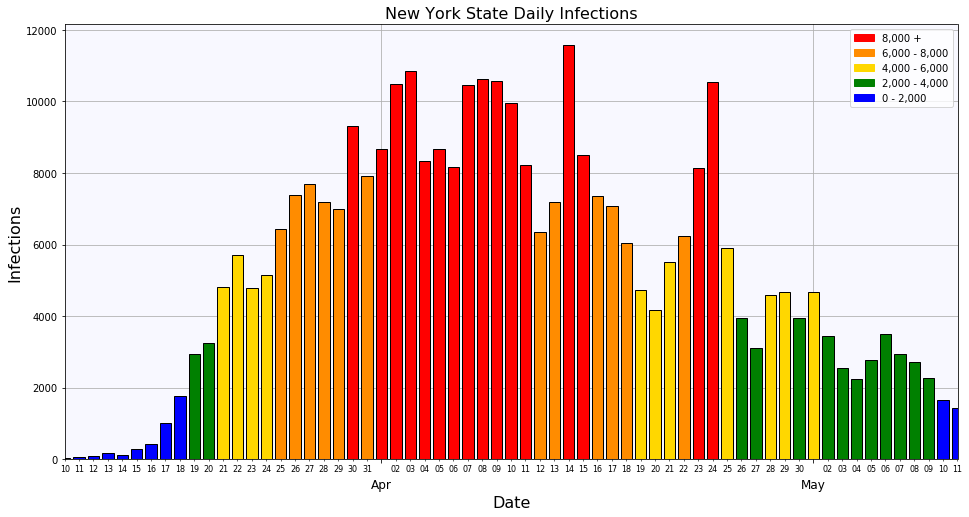

In [6]:
#look and feel of plot
fig1, ax1 = plt.subplots(figsize=(16,8))
ax1.set_title('New York State Daily Infections',fontsize=16)
ax1.set_facecolor('ghostwhite')
ax1.xaxis.set_major_locator(dates.MonthLocator())
ax1.xaxis.set_minor_locator(dates.DayLocator())
ax1.xaxis.set_major_formatter(dates.DateFormatter('%b')) 
ax1.xaxis.set_minor_formatter(dates.DateFormatter('%d'))  
ax1.tick_params(axis='x', direction='out', pad=15, which='major', labelsize=12)
ax1.tick_params(axis='x', which='minor', labelsize=8)
ax1.set_xlim(infections_date.index[8],infections_date.index[-1])
ax1.set_ylabel('Infections',fontsize=16)
ax1.set_xlabel('Date',fontsize=16)
ax1.grid(zorder=0)

#plot data by group colors
ax1.bar(red1.index, red1.values,color='red', edgecolor='black', zorder=3)
ax1.bar(orange1.index, orange1.values,color='darkorange', edgecolor='black', zorder=3)
ax1.bar(yellow1.index, yellow1.values,color='gold', edgecolor='black', zorder=3)
ax1.bar(green1.index, green1.values,color='green', edgecolor='black', zorder=3)
ax1.bar(blue1.index, blue1.values,color='blue', edgecolor='black', zorder=3)

#add labels
r_patch = mpatches.Patch(color='red', label='8,000 +')
o_patch = mpatches.Patch(color='darkorange', label='6,000 - 8,000')
y_patch = mpatches.Patch(color='gold', label='4,000 - 6,000')
g_patch = mpatches.Patch(color='green', label='2,000 - 4,000')
b_patch = mpatches.Patch(color='blue', label='0 - 2,000')
ax1.legend(handles=[r_patch,o_patch,y_patch,g_patch,b_patch])

### Total Infections per County in NY

In [17]:
#use groupby to aggergate total new positives by county
county_sum = df_covid_data.groupby(['County'])['New Positives'].sum()
#use describe to see min/max and length
county_sum.describe()

count       62.000000
mean      5459.435484
std      13170.670003
min          5.000000
25%         67.250000
50%        182.500000
75%       1260.750000
max      57391.000000
Name: New Positives, dtype: float64

In [18]:
#filter infection rate and assign to group based on description
red2 = county_sum[county_sum > 40000].sort_values(ascending=False)
orange2 = county_sum[county_sum.between(20000,39999)].sort_values(ascending=False)
yellow2 = county_sum[county_sum.between(10000,19999)].sort_values(ascending=False)
green2 = county_sum[county_sum.between(5000,9999)].sort_values(ascending=False)
blue2 = county_sum[county_sum.between(1000,4999)].sort_values(ascending=False)
purple2 = county_sum[county_sum.between(500,999)].sort_values(ascending=False)

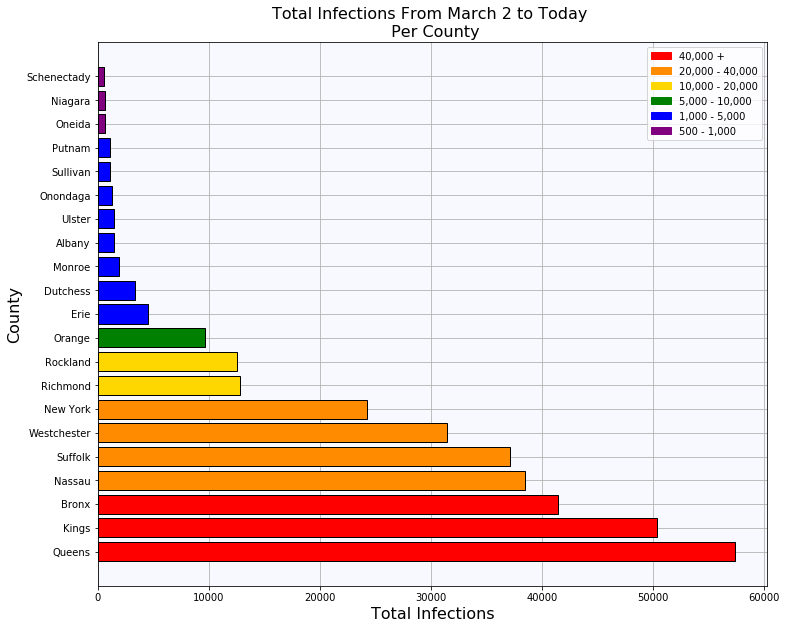

In [13]:
#look and feel of plot
fig2, ax2 = plt.subplots(figsize=(12,10))
ax2.set_title('Total Infections From March 2 to Today \n Per County',fontsize=16)
ax2.set_facecolor('ghostwhite')
ax2.set_ylabel('County',fontsize=16)
ax2.set_xlabel('Total Infections',fontsize=16)
ax2.grid(zorder=0)

#plot data by group colors
ax2.barh(red2.index, red2.values,color='red', edgecolor='black', zorder=3)
ax2.barh(orange2.index, orange2.values,color='darkorange', edgecolor='black', zorder=3)
ax2.barh(yellow2.index, yellow2.values,color='gold', edgecolor='black', zorder=3)
ax2.barh(green2.index, green2.values,color='green', edgecolor='black', zorder=3)
ax2.barh(blue2.index, blue2.values,color='blue', edgecolor='black', zorder=3)
ax2.barh(purple2.index, purple2.values,color='purple', edgecolor='black', zorder=3)

#add labels
r_patch = mpatches.Patch(color='red', label='40,000 +')
o_patch = mpatches.Patch(color='darkorange', label='20,000 - 40,000')
y_patch = mpatches.Patch(color='gold', label='10,000 - 20,000')
g_patch = mpatches.Patch(color='green', label='5,000 - 10,000')
b_patch = mpatches.Patch(color='blue', label='1,000 - 5,000')
p_patch = mpatches.Patch(color='purple', label='500 - 1,000')
ax2.legend(handles=[r_patch,o_patch,y_patch,g_patch,b_patch,p_patch])

### New Infections per Day by County - Animated

In [16]:
#import additional libraries for animation
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

In [22]:
#create a new dataframe using pivot function
df_county = df_covid_data.pivot(index='Test Date', columns='County', values='New Positives')
df_county.head()

County,Albany,Allegany,Bronx,Broome,Cattaraugus,Cayuga,Chautauqua,Chemung,Chenango,Clinton,...,Sullivan,Tioga,Tompkins,Ulster,Warren,Washington,Wayne,Westchester,Wyoming,Yates
Test Date,,,,,,,,,,,,,,,,,,,,,
2020-03-02,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
2020-03-03,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-03-04,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-03-05,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,19,0,0
2020-03-06,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [30]:
pd.set_option('display.max_rows', None)
#view statistics to create color groups
print(df_county.describe().T.sort_values(by='max',ascending=False))

              count        mean         std  min    25%    50%     75%     max
County                                                                        
Kings          71.0  708.887324  547.414117  0.0  268.5  674.0  1082.0  2663.0
Queens         71.0  808.323944  600.840786  0.0  327.0  812.0  1238.0  2022.0
Nassau         71.0  541.323944  476.164821  0.0  152.5  420.0   895.5  1938.0
New York       71.0  340.718310  279.291767  0.0  140.0  324.0   501.5  1737.0
Suffolk        71.0  522.000000  429.766315  0.0  172.0  422.0   840.0  1569.0
Bronx          71.0  583.676056  446.286800  0.0  172.5  606.0   961.5  1482.0
Westchester    71.0  443.267606  346.525075  0.0  157.5  394.0   678.5  1253.0
Rockland       71.0  176.112676  184.405961  0.0   28.0  129.0   270.5  1000.0
Orange         71.0  135.661972  137.599517  0.0   37.0  114.0   181.0   818.0
Richmond       71.0  179.845070  154.626430  0.0   39.0  154.0   292.5   641.0
Putnam         71.0   15.464789   32.567219  0.0    

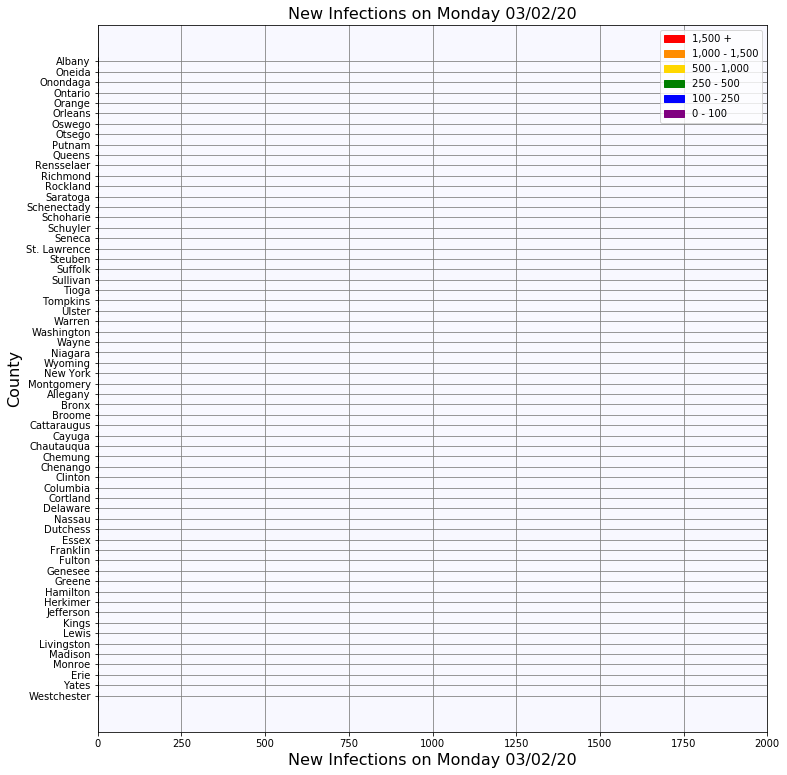

In [31]:
fig3, ax3 = plt.subplots(figsize=(12,13))

#create a function that will replot every iteration of the animation
def animate(i):
    #refresh data from new row and filter to color group
    ser3 = df_county.iloc[i]
    red3 = ser3[ser3 > 1500].sort_values(ascending=False)
    orange3 = ser3[ser3.between(1000,1499)].sort_values(ascending=False)
    yellow3 = ser3[ser3.between(500,999)].sort_values(ascending=False)
    green3 = ser3[ser3.between(250,499)].sort_values(ascending=False)
    blue3 = ser3[ser3.between(100,249)].sort_values(ascending=False)
    purple3 = ser3[ser3.between(0,99)].sort_values(ascending=False)
    
    #clear and refresh look and feel of plot
    ax3.clear()
    ax3.set_xlim(0,2000)
    ax3.grid(color='grey',zorder=0)
    ax3.set_title("New Infections on " + df_county.iloc[i].name.strftime('%A %D'),fontsize=16)
    ax3.set_facecolor('ghostwhite')
    ax3.set_ylabel('County',fontsize=16)
    ax3.set_xlabel("New Infections on " + df_county.iloc[i].name.strftime('%A %D'),fontsize=16)

    #plot by color group
    ax3.barh(red3.index, red3.values,color='red', edgecolor='black', zorder=3)
    ax3.barh(orange3.index, orange3.values,color='darkorange', edgecolor='black', zorder=3)
    ax3.barh(yellow3.index, yellow3.values,color='gold', edgecolor='black', zorder=3)
    ax3.barh(green3.index, green3.values,color='green', edgecolor='black', zorder=3)
    ax3.barh(blue3.index, blue3.values,color='blue', edgecolor='black', zorder=3)
    ax3.barh(purple3.index, purple3.values,color='purple', edgecolor='black', zorder=3)
    
    #add labels
    r_patch = mpatches.Patch(color='red', label='1,500 +')
    o_patch = mpatches.Patch(color='darkorange', label='1,000 - 1,500')
    y_patch = mpatches.Patch(color='gold', label='500 - 1,000')
    g_patch = mpatches.Patch(color='green', label='250 - 500')
    b_patch = mpatches.Patch(color='blue', label='100 - 250')
    p_patch = mpatches.Patch(color='purple', label='0 - 100')
    ax3.legend(handles=[r_patch,o_patch,y_patch,g_patch,b_patch,p_patch])

#animate function will iterate the length of the dataframe
anim = FuncAnimation(fig3, animate, frames=len(df_county), interval=1000) #inline keyword will result in static plot

In [32]:
#Convert the static plot to JavaScript to display animation
HTML(anim.to_jshtml())

### Cumulative Infections by County - Animated

In [33]:
#New blank dataframe
df_county_runsum = pd.DataFrame(0,columns=df_county.columns,index=df_county.index)
#loop through each row in df_county and sum all the previous rows
for i in range(len(df_county)):
    df_county_runsum.iloc[i] = df_county.iloc[:i].sum()
df_county_runsum.tail()

County,Albany,Allegany,Bronx,Broome,Cattaraugus,Cayuga,Chautauqua,Chemung,Chenango,Clinton,...,Sullivan,Tioga,Tompkins,Ulster,Warren,Washington,Wayne,Westchester,Wyoming,Yates
Test Date,,,,,,,,,,,,,,,,,,,,,
2020-05-07,1348,35,40181,360,59,52,40,129,105,69,...,1021,97,130,1416,193,190,78,30708,71,19
2020-05-08,1384,35,40533,364,59,52,40,130,105,74,...,1039,99,131,1429,199,201,79,30905,73,20
2020-05-09,1416,35,40804,372,60,53,40,131,109,76,...,1071,104,132,1440,202,204,79,31087,75,20
2020-05-10,1432,36,41059,373,60,58,41,131,109,76,...,1093,105,132,1450,207,206,80,31294,77,21
2020-05-11,1456,38,41296,378,61,60,41,131,111,76,...,1109,107,132,1454,217,210,81,31384,77,21


In [41]:
#view statistics to create color groups
print(df_county_runsum.describe().T.sort_values(by='max',ascending=False).round(2))

              count      mean       std  min    25%      50%      75%      max
County                                                                        
Queens         71.0  24690.10  21510.64  0.0  880.5  23133.0  45645.5  57180.0
Kings          71.0  21502.04  18764.90  0.0  997.0  19702.0  40001.0  50072.0
Bronx          71.0  17077.27  15574.75  0.0  458.5  14327.0  32180.0  41296.0
Nassau         71.0  17169.51  15042.65  0.0  561.5  15616.0  32444.5  38337.0
Suffolk        71.0  15611.48  14214.70  0.0  274.5  13487.0  30086.5  36911.0
Westchester    71.0  14503.63  11828.21  0.0  945.0  14294.0  26296.0  31384.0
New York       71.0  10871.08   9005.90  0.0  955.5  10440.0  19601.0  24062.0
Richmond       71.0   5547.62   4949.63  0.0  148.0   4579.0  10736.5  12747.0
Rockland       71.0   5582.20   4866.94  0.0   77.0   5703.0   9959.5  12484.0
Orange         71.0   3893.80   3599.28  0.0   67.5   3397.0   6985.5   9584.0
Erie           71.0   1436.25   1485.90  0.0   29.5 

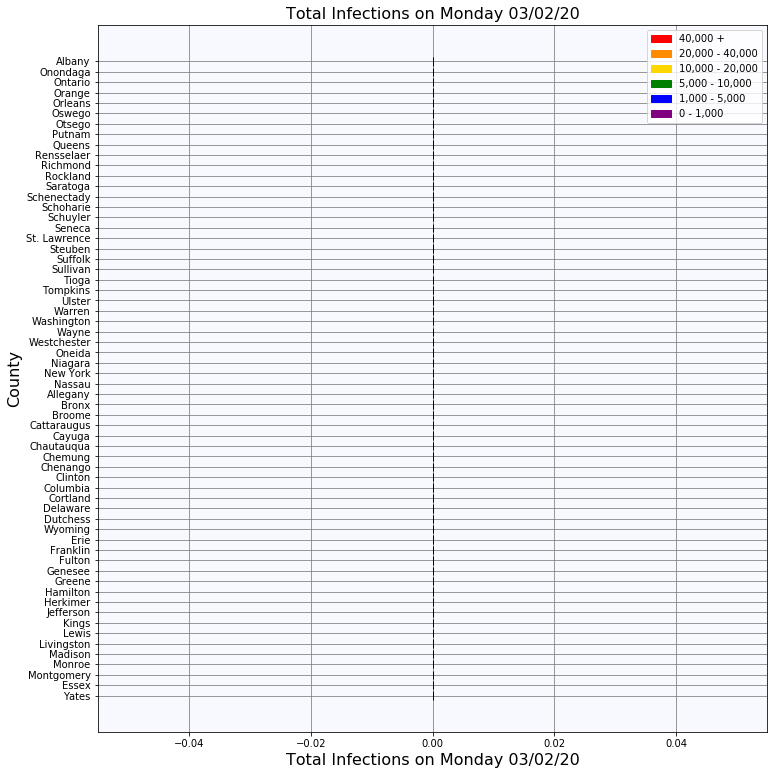

In [42]:
fig4,ax4 = plt.subplots(figsize=(12,13))

#create a function that will replot every iteration of the animation
def animate4(i):
    #refresh data from new row and filter to color group
    ser4 = df_county_runsum.iloc[i]
    red = ser4[ser4 > 40000].sort_values(ascending=False)
    orange = ser4[ser4.between(20000,39999)].sort_values(ascending=False)
    yellow = ser4[ser4.between(10000,19999)].sort_values(ascending=False)
    green = ser4[ser4.between(5000,9999)].sort_values(ascending=False)
    blue = ser4[ser4.between(1000,4999)].sort_values(ascending=False)
    purple = ser4[ser4.between(0,999)].sort_values(ascending=False)
    
    #clear and refresh look and feel of plot
    ax4.clear()
    ax4.grid(color='grey',zorder=0)
    ax4.set_title("Total Infections on " + df_county.iloc[i].name.strftime('%A %D'),fontsize=16)
    ax4.set_facecolor('ghostwhite')
    ax4.set_ylabel('County', fontsize=16)
    ax4.set_xlabel("Total Infections on " + df_county.iloc[i].name.strftime('%A %D'),fontsize=16)
    
    #plot by color group
    ax4.barh(red.index, red.values,color='red', edgecolor='black', zorder=3)
    ax4.barh(orange.index, orange.values,color='darkorange', edgecolor='black', zorder=3)
    ax4.barh(yellow.index, yellow.values,color='gold', edgecolor='black', zorder=3)
    ax4.barh(green.index, green.values,color='green', edgecolor='black', zorder=3)
    ax4.barh(blue.index, blue.values,color='blue', edgecolor='black', zorder=3)
    ax4.barh(purple.index, purple.values,color='purple', edgecolor='black', zorder=3)
    
    #add labels
    r_patch = mpatches.Patch(color='red', label='40,000 +')
    o_patch = mpatches.Patch(color='darkorange', label='20,000 - 40,000')
    y_patch = mpatches.Patch(color='gold', label='10,000 - 20,000')
    g_patch = mpatches.Patch(color='green', label='5,000 - 10,000')
    b_patch = mpatches.Patch(color='blue', label='1,000 - 5,000')
    p_patch = mpatches.Patch(color='purple', label='0 - 1,000')
    ax4.legend(handles=[r_patch,o_patch,y_patch,g_patch,b_patch,p_patch])

#animate function will iterate the length of the dataframe
anim4 = FuncAnimation(fig4, animate4, frames=len(df_county_runsum), interval=1000)

In [44]:
#Convert the static plot to JavaScript to display animation
HTML(anim4.to_jshtml())

### Plotting Geograhical Data

In [46]:
#download geodata from healthcare.gov - https://data.healthcare.gov/dataset/Geocodes-USA-with-Counties/52wv-g36k
df_geo = pd.read_csv("Geocodes_USA_with_Counties.csv")
#filter only NY counties
df_geo = df_geo[df_geo.state == "NY"]
df_geo.head()

,zip,primary_city,state,latitude,longitude,county,type,world_region,country,decommissioned,estimated_population,notes
26144,501,Holtsville,NY,40.81,-73.04,Suffolk,UNIQUE,NaN,US,0,384,NaN
26145,544,Holtsville,NY,40.81,-73.04,Suffolk,UNIQUE,NaN,US,0,0,NaN
26146,6390,Fishers Island,NY,41.27,-71.99,Suffolk,PO BOX,NaN,US,0,0,NaN
26147,10001,New York,NY,40.71,-73.99,New York,STANDARD,NaN,US,0,16553,NaN
26148,10002,New York,NY,40.71,-73.99,New York,STANDARD,NaN,US,0,70604,NaN


In [47]:
#Aggergate the counties and use the mean of all the latitudes and longitude
df_geo = df_geo.groupby(['county'])['latitude','longitude'].mean()
df_geo.drop('St Lawrence',axis=0,inplace=True) #removing typo
df_geo.head()

,latitude,longitude
county,,
Albany,42.636026,-73.839872
Allegany,42.238214,-78.052143
Bronx,40.840000,-73.870000
Broome,42.142903,-75.879032
Cattaraugus,42.285455,-78.672424


In [48]:
#add the last row from our last plot. That contains today's total infections for each county 
df_geo['Total Infections'] = df_county_runsum.iloc[-1]
df_geo.head()

,latitude,longitude,Total Infections
county,,,
Albany,42.636026,-73.839872,1456
Allegany,42.238214,-78.052143,38
Bronx,40.840000,-73.870000,41296
Broome,42.142903,-75.879032,378
Cattaraugus,42.285455,-78.672424,61


In [53]:
#view stats
df_geo['Total Infections'].describe()

count       62.000000
mean      5436.370968
std      13120.850354
min          5.000000
25%         67.250000
50%        181.500000
75%       1242.500000
max      57180.000000
Name: Total Infections, dtype: float64

In [49]:
#download png map from openstreetmap.org - https://www.openstreetmap.org/export#map=6/41.829/-74.707
mymap = plt.imread('map.png')
bbox = (-80, -72, 40.5, 45) #boundries of NY State. needs to match coordinates for exported map from openstreet

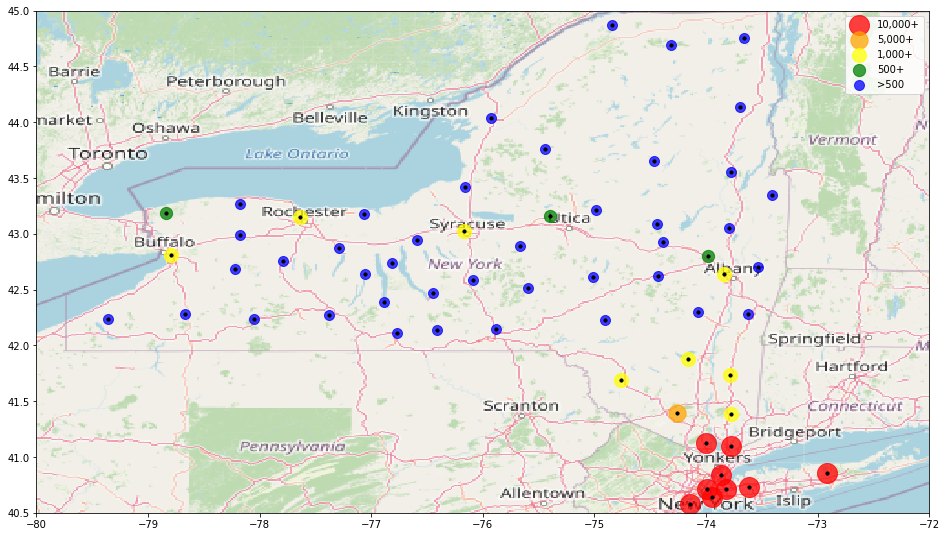

In [50]:
#create figure and subplot
fig5, ax5 = plt.subplots(figsize = (16,14))
ax5.set_ylim(40.5, 45) #latitudes
ax5.set_xlim(-80,-72) #longitudes

#plot infections > 10000
long = df_geo[df_geo['Total Infections'] >= 10000].longitude
lat = df_geo[df_geo['Total Infections'] >= 10000].latitude
red5 = ax5.scatter(long, lat, c='red', s=400, alpha=.75)

# infections > 5000
long = df_geo[df_geo['Total Infections'].between(5000,9999)].longitude
lat = df_geo[df_geo['Total Infections'].between(5000,9999)].latitude
orange5 = ax5.scatter(long, lat, c='orange', s=300, alpha=.75)

# infections > 1000
long = df_geo[df_geo['Total Infections'].between(1000,4999)].longitude
lat = df_geo[df_geo['Total Infections'].between(1000,4999)].latitude
yellow5 = ax5.scatter(long, lat, c='yellow', s=200, alpha=.75)

#infections > 500
long = df_geo[df_geo['Total Infections'].between(500,999)].longitude
lat = df_geo[df_geo['Total Infections'].between(500,999)].latitude
green5 = ax5.scatter(long, lat, c='green', s=150, alpha=.75)

#infections 0 - 499
long = df_geo[df_geo['Total Infections'].between(0,499)].longitude
lat = df_geo[df_geo['Total Infections'].between(0,499)].latitude
blue5 = ax5.scatter(long, lat, c='blue', s=100, alpha=.75)

#black dot
ax5.scatter(df_geo.longitude, df_geo.latitude, c="black", s=10)

#add the map image
ax5.imshow(mymap, zorder=0, extent = bbox, aspect= 'equal')

#add legend
ax5.legend((red5,orange5,yellow5,green5,blue5), ('10,000+','5,000+','1,000+','500+','>500'))